In [2]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

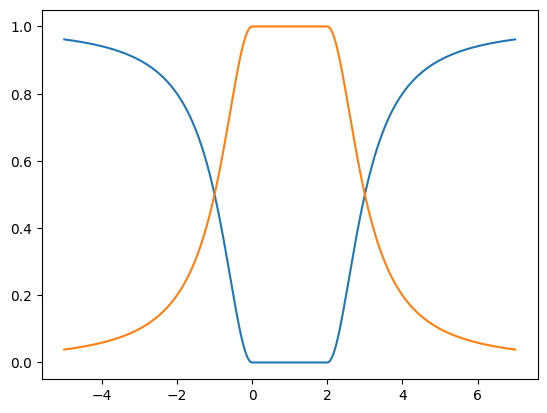

In [3]:
Thet_max=5
R_max=5
bande=2
n_points=200

T_neg=np.linspace(-Thet_max,0, n_points)
T_mil=np.linspace(0,bande,n_points//10)
T_pos=np.linspace(bande,Thet_max+bande,n_points)
R=np.linspace(-R_max,R_max,n_points)

Y_neg=np.sin(np.arctan(T_neg))**2
Z_neg=np.cos(np.arctan(T_neg))**2
Y_mil=0*T_mil
Z_mil=1 + 0 * T_mil
Y_pos = np.sin(np.arctan(T_pos - bande))**2
Z_pos = np.cos(np.arctan(T_pos - bande))**2

T=np.concatenate( (T_neg,T_mil,T_pos ) )
Y=np.concatenate( (Y_neg,Y_mil,Y_pos ) )
Z=np.concatenate( (Z_neg,Z_mil,Z_pos ) )

plt.plot(T,Y)
plt.plot(T,Z)
plt.show()

In [4]:
P=[]

for i in range(len(T)):
    for r in R:
        P.append( (T[i],r*Y[i],r*Z[i]) )

P=np.array(P)
len(P)

X,Y,Z=P[:,0],P[:,1],P[:,2]

In [5]:
fig = go.Figure(data = [go.Scatter3d(
    x=X,
    y=Y,
    z=Z,
    mode='markers',
    marker=dict(
            size=5,
            color=P[:,0],
            colorscale='blackbody',  # Choose a colorscale
            opacity=1,
        ),
        text=[f'Point {i}' for i in range(len(P))] 
)]
)

# Set labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title='Représentation de la variété'
)

# Show the plot
fig.show()

In [11]:
Supp=np.linspace(-4,5,400)
R_allege=np.linspace(-2,2,50)
X_triche=[]
Y_triche=[]
for s in Supp:
    if 0<=s<=1:
        X_triche.append(s)
        Y_triche.append(0)
    else:
        for r in R:
            X_triche.append(s)
            Y_triche.append(r*1)

fig = go.Figure(data = [go.Scatter(
    x=X_triche,
    y=Y_triche,
    mode='markers',
    marker=dict(
            size=5,
            color=X_triche,
            colorscale='blackbody',  # Choose a colorscale
            opacity=1,
        ),
        text=[f'Point {i}' for i in range(len(P))] 
)]
)

# Set labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title='Projection orthogonale de la variété sur le plan (x,y)'
)

# Show the plot
fig.show()